In [38]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np
from deepgaze_pytorch.deepgaze2e import DeepGazeIIE
from  deepgaze_pytorch.features.normalizer import Normalizer
from deepgaze_pytorch.deepgaze2e_original import DeepGazeIIEE
import scipy.special
import pysaliency
from pysaliency.plotting import visualize_distribution
from scipy.ndimage import gaussian_filter, zoom
from scipy.special import logsumexp
from scipy.ndimage import gaussian_filter

In [39]:
class CenterBiasModel:
    """Center bias model from data.py"""
    def __init__(self, sigma=0.5):
        self.sigma = sigma
        self._cached_log_density = None
        self._cached_shape = None

    def log_density(self, stimulus):
        if stimulus is None:
            raise ValueError("Stimulus cannot be None")
           
        height, width = stimulus.shape[:2]
       
        if self._cached_log_density is not None and self._cached_shape == (height, width):
            return self._cached_log_density
       
        y = np.linspace(-1, 1, height, dtype=np.float32)[:, np.newaxis]
        x = np.linspace(-1, 1, width, dtype=np.float32)[np.newaxis, :]
        gaussian = np.exp(-(x**2 + y**2) / (2 * self.sigma**2))
        gaussian = gaussian / gaussian.sum()
        log_density = np.log(gaussian + 1e-20)
        log_density = log_density - scipy.special.logsumexp(log_density)
       
        self._cached_log_density = log_density
        self._cached_shape = (height, width)
       
        return log_density

In [40]:
def load_our_model(model_path, device, num_categories=20):
    """
    Carga nuestro modelo entrenado.
    Args:
        model_path: ruta al modelo guardado
        device: dispositivo donde cargar el modelo
        num_categories: número de categorías que maneja el modelo (default: 20 para CAT2000)
    """
    print("Cargando nuestro modelo...")
    model = DeepGazeIIE(num_categories=num_categories, pretrained=False)
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    model = model.to(device)
    model.eval()
    return model

In [41]:
def load_pretrained_model(device):
    """Carga el modelo pre-entrenado original manejando la discrepancia de estructura."""
    print("Cargando modelo pre-entrenado...")
    model = DeepGazeIIEE(pretrained=True)
    
    # # Descargar los pesos pre-entrenados
    # url = 'https://github.com/matthias-k/DeepGaze/releases/download/v1.0.0/deepgaze2e.pth'
    # state_dict = torch.hub.load_state_dict_from_url(url, map_location='cpu')
    
    # # Filtrar las keys que coinciden con nuestro modelo
    # model_dict = model.state_dict()
    # # pretrained_dict = {k: v for k, v in state_dict.items() if k in model_dict}
    # # model_dict.update(pretrained_dict)
    
    # # Cargar los pesos filtrados
    # model.load_state_dict(model_dict)
    model = model.to(device)
    model.eval()
    return model

In [42]:
def load_and_preprocess_image(image_path, target_size=(1920, 1080)):
    """Carga y preprocesa una imagen."""
    image = Image.open(image_path).convert('RGB')
    image = image.resize(target_size, Image.Resampling.LANCZOS)
    image_np = np.array(image)
    image_tensor = torch.tensor([image_np.transpose(2, 0, 1)])
    return image, image_np, image_tensor

In [43]:
def prepare_centerbias(image_np, mit_centerbias_template, our_centerbias_model):
    """Prepara ambos center bias para la imagen."""
    # Nuestro center bias
    our_cb = our_centerbias_model.log_density(image_np)
    our_cb_tensor = torch.tensor([our_cb])
    
    # MIT center bias
    mit_cb = zoom(mit_centerbias_template, 
                 (image_np.shape[0]/mit_centerbias_template.shape[0],
                  image_np.shape[1]/mit_centerbias_template.shape[1]), 
                 order=0, mode='nearest')
    mit_cb -= logsumexp(mit_cb)
    mit_cb_tensor = torch.tensor([mit_cb])
    
    return our_cb_tensor, mit_cb_tensor

In [44]:
def visualize_predictions(image, our_pred, pretrained_pred, filename):
    """Visualiza las predicciones de ambos modelos."""
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'Comparación para: {filename} con pesos por clase', fontsize=16)
    
    # Primera fila - Nuestro modelo
    axes[0, 0].imshow(image)
    axes[0, 0].set_title('Imagen Original')
    axes[0, 0].set_axis_off()
    
    axes[0, 1].matshow(our_pred)
    axes[0, 1].set_title('Nuestro Modelo\nLog Density')
    axes[0, 1].set_axis_off()
    
    visualize_distribution(our_pred, ax=axes[0, 2])
    axes[0, 2].set_title('Nuestro Modelo\nPredicción')
    axes[0, 2].set_axis_off()
    
    # Segunda fila - Modelo pre-entrenado
    axes[1, 0].imshow(image)
    axes[1, 0].set_title('Imagen Original')
    axes[1, 0].set_axis_off()
    
    axes[1, 1].matshow(pretrained_pred)
    axes[1, 1].set_title('Modelo Original\nLog Density')
    axes[1, 1].set_axis_off()
    
    visualize_distribution(pretrained_pred, ax=axes[1, 2])
    axes[1, 2].set_title('Modelo Original\nPredicción')
    axes[1, 2].set_axis_off()
    
    plt.tight_layout()
    plt.show()

In [45]:
def compare_models(our_model_path, input_folder, mit_centerbias_path):
    """Función principal para comparar modelos."""
    # Configurar device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Usando dispositivo: {device}")

    # Cargar modelos
    our_model = load_our_model(our_model_path, device, num_categories=20)  # Especificamos las 20 categorías de CAT2000
    pretrained_model = load_pretrained_model(device)

    # Preparar componentes
    our_centerbias = CenterBiasModel()
    mit_centerbias_template = np.load(mit_centerbias_path)

    images_info = [
    ("028.jpg", "Cartoon", 4),
    ("158.jpg", "Pattern", 15),
    ("180.jpg", "Social", 19),
    ("190.jpg", "OutdoorManMade", 13),
    ("9107ae4604381c7cada00ea3ba2b33e3.jpg", "Action", 0),
    ]

    print(f"\nProcesando {len(images_info)} imágenes")

    for filename, category_name, category_idx in images_info:
        print(f"\nProcesando: {filename}")
        print(f"Categoría: {category_name} (idx: {category_idx})")
        
        image_path = os.path.join(input_folder, filename)
        if not os.path.exists(image_path):
            print(f"Archivo no encontrado: {image_path}")
            continue

        # Cargar y preprocesar imagen
        image, image_np, image_tensor = load_and_preprocess_image(image_path)
        image_tensor = image_tensor.to(device)

        # Preparar center bias
        our_cb, mit_cb = prepare_centerbias(image_np, mit_centerbias_template, our_centerbias)
        our_cb = our_cb.to(device)
        mit_cb = mit_cb.to(device)

        # Crear tensor de categoría
        category_tensor = torch.tensor([category_idx], device=device)

        # Obtener predicciones
    # Obtener predicciones
        with torch.no_grad():
            our_pred = our_model(image_tensor, our_cb, category_tensor)
            pretrained_pred = pretrained_model(image_tensor, mit_cb)

            # Ajustar las dimensiones
            our_pred = our_pred.cpu().numpy()
            pretrained_pred = pretrained_pred.cpu().numpy()
            
            # Si our_pred tiene dimensión extra, quitarla
            if len(our_pred.shape) > 2:
                our_pred = our_pred.squeeze()
                
            # Si pretrained_pred tiene dimensión extra, quitarla
            if len(pretrained_pred.shape) > 2:
                pretrained_pred = pretrained_pred.squeeze()
            
            # Imprimir formas para debug
            print(f"Forma de our_pred: {our_pred.shape}")
            print(f"Forma de pretrained_pred: {pretrained_pred.shape}")

        # Visualizar resultados
        # visualize_predictions(image, our_pred, pretrained_pred, f"{filename} ({category_name})", category_name)
        visualize_predictions(image, our_pred, pretrained_pred, f"{filename} ({category_name})")


    # Para referencia, aquí está el mapeo completo de categorías
    CATEGORY_MAPPING = {
        'Action': 0, 
        'Affective': 1, 
        'Art': 2, 
        'BlackWhite': 3,
        'Cartoon': 4, 
        'Fractal': 5, 
        'Indoor': 6, 
        'Inverted': 7,
        'Jumbled': 8, 
        'LineDrawing': 9, 
        'LowResolution': 10,
        'Noisy': 11, 
        'Object': 12, 
        'OutdoorManMade': 13,
        'OutdoorNatural': 14, 
        'Pattern': 15, 
        'Random': 16,
        'Satelite': 17, 
        'Sketch': 18, 
        'Social': 19
    }


In [46]:
if __name__ == "__main__":
    MODEL_PATH = r"C:\Users\Adrian\Desktop\deepgaze_pytorch\deepgaze_pytorch\checkpoints\final.pth"
    INPUT_FOLDER = r"c:\Users\Adrian\Desktop\imagenes_de_prueba"
    MIT_CENTERBIAS_PATH = r"C:\Users\Adrian\Desktop\ggg\Deep_Learning_Eye_Gaze\DeepGazeIIE\centerbias\centerbias_mit1003.npy"

In [47]:
# Configurar dispositivo y componentes
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Usando dispositivo: {device}")

Usando dispositivo: cuda


Usando dispositivo: cuda
Cargando nuestro modelo...

Inicializando DeepGazeIIE
Número de categorías: 20
Número de backbones: 4

Seeds para RGBShapeNetC:
Instancia 1: [8631, 8074, 59, 2942, 3575]
Instancia 2: [2038, 3188, 4849, 1589, 5686]
Instancia 3: [832, 6696, 8095, 9316, 3123]

Seeds para RGBEfficientNetB5:
Instancia 1: [7559, 4308, 4823, 1406, 4533]
Instancia 2: [1368, 6066, 6067, 9787, 8649]
Instancia 3: [9941, 4045, 5671, 4396, 8366]

Seeds para RGBDenseNet201:
Instancia 1: [3713, 3649, 4929, 7460, 69]
Instancia 2: [3519, 5061, 4321, 6914, 7336]
Instancia 3: [8758, 6326, 9146, 6686, 7196]

Seeds para RGBResNext50:
Instancia 1: [165, 2436, 6038, 2386, 7745]
Instancia 2: [7078, 8711, 5484, 9989, 3243]
Instancia 3: [7812, 6234, 174, 8834, 4228]

Creando mixture para RGBShapeNetC
Total de componentes (instancias × folds): 15

Creando instancia 1, fold 1 con seed 8631

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0000
Std: 0.0312

Pesos de lay

Using cache found in C:\Users\Adrian/.cache\torch\hub\pytorch_vision_v0.6.0


Total de componentes (instancias × folds): 15

Creando instancia 1, fold 1 con seed 3713

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0002
Std: 0.0311

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: 0.0229
Std: 0.5289

Pesos de layernorm2.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv2.weight:
Mean: 0.0664
Std: 0.4242

Creando instancia 1, fold 2 con seed 3649

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0001
Std: 0.0311

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: -0.0408
Std: 0.5134

Pesos de layernorm2.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv2.weight:
Mean: 0.0298
Std: 0.3675

Creando instancia 1, fold 3 con seed 4929

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0001
Std: 0.0310

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: 0.0412
Std: 0.45

Using cache found in C:\Users\Adrian/.cache\torch\hub\pytorch_vision_v0.6.0


Total de componentes (instancias × folds): 15

Creando instancia 1, fold 1 con seed 165

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: 0.0001
Std: 0.0279

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: -0.0088
Std: 0.5128

Pesos de layernorm2.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv2.weight:
Mean: 0.0078
Std: 0.3869

Creando instancia 1, fold 2 con seed 2436

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: 0.0001
Std: 0.0281

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: -0.0447
Std: 0.4759

Pesos de layernorm2.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv2.weight:
Mean: 0.0103
Std: 0.4053

Creando instancia 1, fold 3 con seed 6038

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0001
Std: 0.0277

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: -0.0998
Std: 0.522

Using cache found in C:\Users\Adrian/.cache\torch\hub\pytorch_vision_v0.6.0
Using cache found in C:\Users\Adrian/.cache\torch\hub\pytorch_vision_v0.6.0



Procesando 5 imágenes

Procesando: 028.jpg
Categoría: Cartoon (idx: 4)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


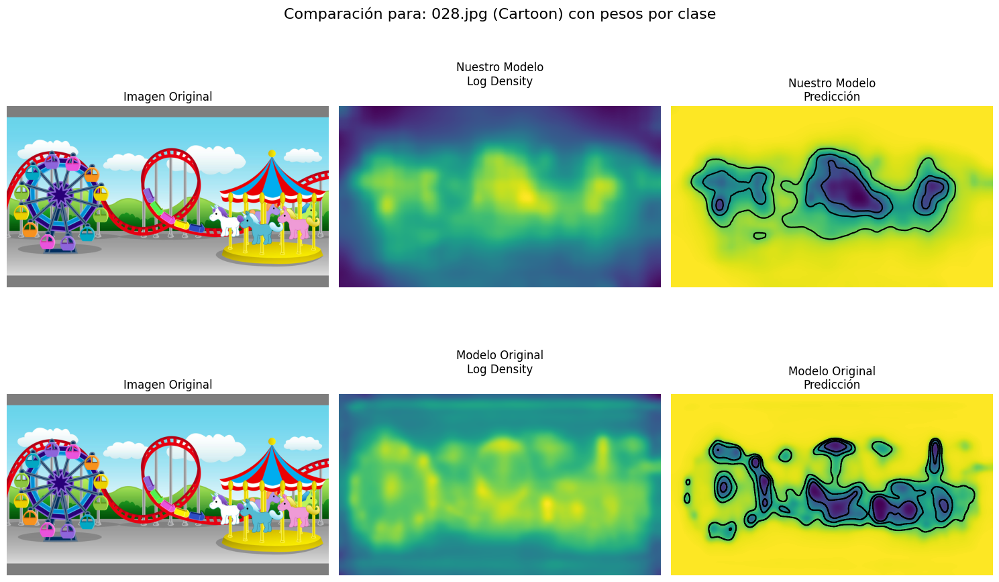


Procesando: 158.jpg
Categoría: Pattern (idx: 15)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


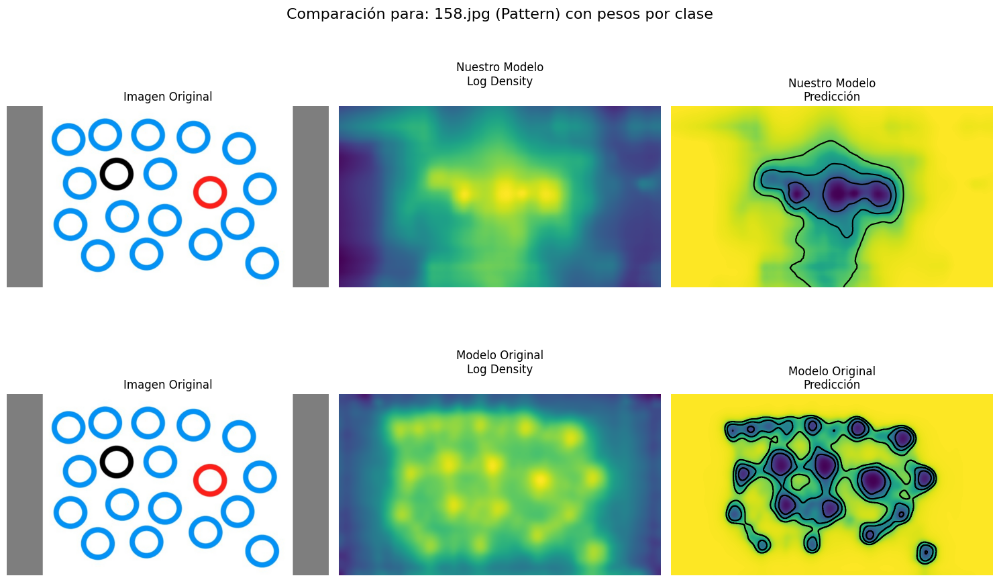


Procesando: 180.jpg
Categoría: Social (idx: 19)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


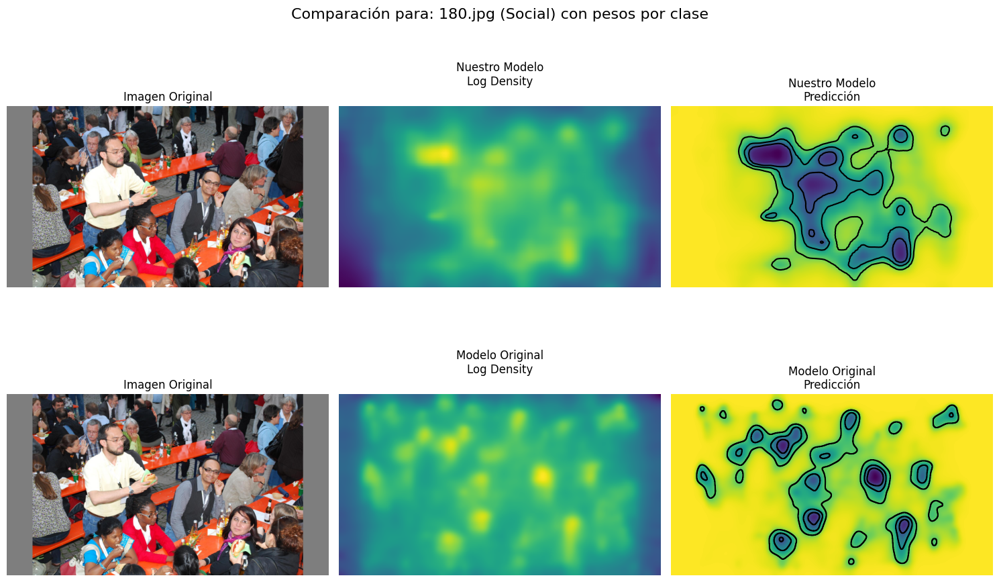


Procesando: 190.jpg
Categoría: OutdoorManMade (idx: 13)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


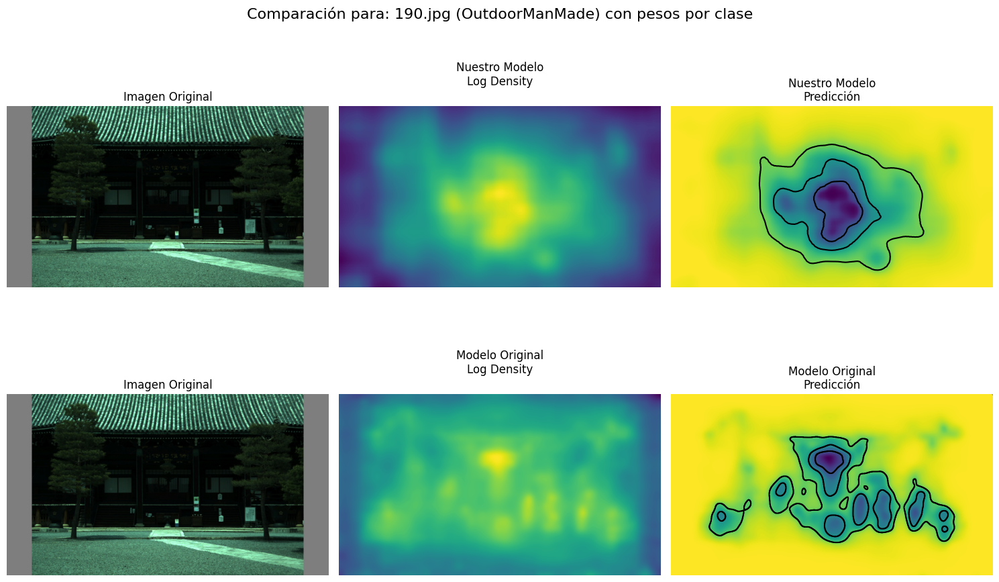


Procesando: 9107ae4604381c7cada00ea3ba2b33e3.jpg
Categoría: Action (idx: 0)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


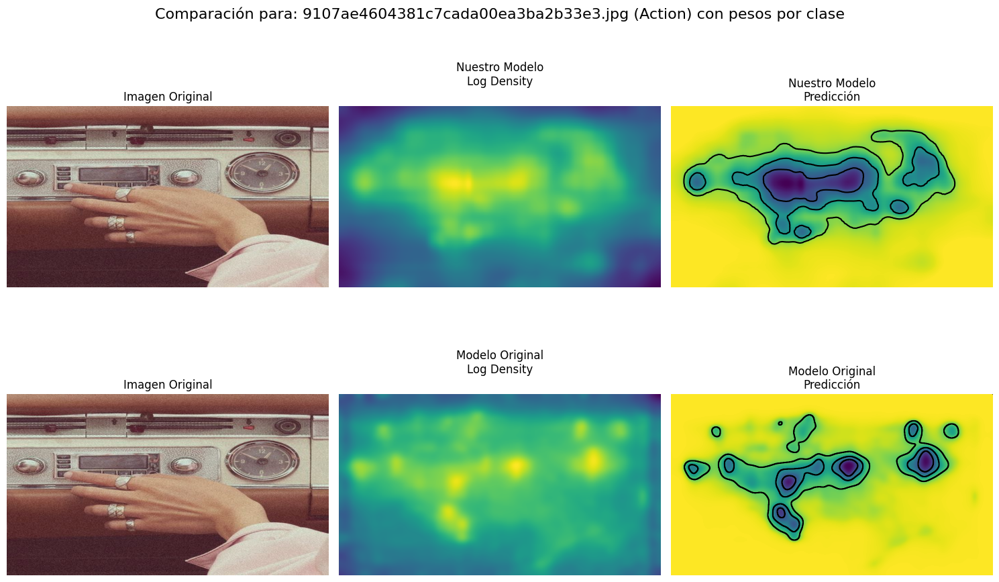

In [48]:
compare_models(MODEL_PATH, INPUT_FOLDER, MIT_CENTERBIAS_PATH)

In [49]:
def compare_models(our_model_path, input_folder, mit_centerbias_path):
    """Función principal para comparar modelos."""
    # Configurar device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Usando dispositivo: {device}")

    # Cargar modelos
    our_model = load_our_model(our_model_path, device, num_categories=20)  # Especificamos las 20 categorías de CAT2000
    pretrained_model = load_pretrained_model(device)

    # Preparar componentes
    our_centerbias = CenterBiasModel()
    mit_centerbias_template = np.load(mit_centerbias_path)

    images_info = [
    ("028.jpg", "BlackWhite", 3), #Cartoon
    ("158.jpg", "BlackWhite", 3), #Pattern
    ("180.jpg", "BlackWhite", 3), #Social
    ("190.jpg", "Social", 19), #OutdoorManMade
    ("9107ae4604381c7cada00ea3ba2b33e3.jpg", "Cartoon", 4), #Action
    ]

    print(f"\nProcesando {len(images_info)} imágenes")

    for filename, category_name, category_idx in images_info:
        print(f"\nProcesando: {filename}")
        print(f"Categoría: {category_name} (idx: {category_idx})")
        
        image_path = os.path.join(input_folder, filename)
        if not os.path.exists(image_path):
            print(f"Archivo no encontrado: {image_path}")
            continue

        # Cargar y preprocesar imagen
        image, image_np, image_tensor = load_and_preprocess_image(image_path)
        image_tensor = image_tensor.to(device)

        # Preparar center bias
        our_cb, mit_cb = prepare_centerbias(image_np, mit_centerbias_template, our_centerbias)
        our_cb = our_cb.to(device)
        mit_cb = mit_cb.to(device)

        # Crear tensor de categoría
        category_tensor = torch.tensor([category_idx], device=device)

        # Obtener predicciones
    # Obtener predicciones
        with torch.no_grad():
            our_pred = our_model(image_tensor, our_cb, category_tensor)
            pretrained_pred = pretrained_model(image_tensor, mit_cb)

            # Ajustar las dimensiones
            our_pred = our_pred.cpu().numpy()
            pretrained_pred = pretrained_pred.cpu().numpy()
            
            # Si our_pred tiene dimensión extra, quitarla
            if len(our_pred.shape) > 2:
                our_pred = our_pred.squeeze()
                
            # Si pretrained_pred tiene dimensión extra, quitarla
            if len(pretrained_pred.shape) > 2:
                pretrained_pred = pretrained_pred.squeeze()
            
            # Imprimir formas para debug
            print(f"Forma de our_pred: {our_pred.shape}")
            print(f"Forma de pretrained_pred: {pretrained_pred.shape}")

        # Visualizar resultados
        # visualize_predictions(image, our_pred, pretrained_pred, f"{filename} ({category_name})", category_name)
        visualize_predictions(image, our_pred, pretrained_pred, f"{filename} ({category_name})")


    # Para referencia, aquí está el mapeo completo de categorías
    CATEGORY_MAPPING = {
        'Action': 0, 
        'Affective': 1, 
        'Art': 2, 
        'BlackWhite': 3,
        'Cartoon': 4, 
        'Fractal': 5, 
        'Indoor': 6, 
        'Inverted': 7,
        'Jumbled': 8, 
        'LineDrawing': 9, 
        'LowResolution': 10,
        'Noisy': 11, 
        'Object': 12, 
        'OutdoorManMade': 13,
        'OutdoorNatural': 14, 
        'Pattern': 15, 
        'Random': 16,
        'Satelite': 17, 
        'Sketch': 18, 
        'Social': 19
    }


Best Perfomances for categories visualizations

These are the dominant backbones for each category
To run a test of performance I am going to change the dominant category
For visualizations to see the improvements
The last number in images info means the category number

0 = ShapeNetC |
1 = EfficientNetB5 |
2 = DenseNet201 |
3 = ResNext50 

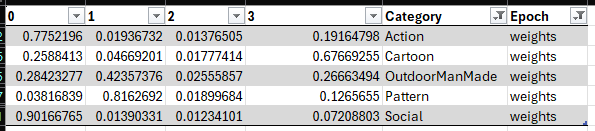

Worst Perfomances for categories visualizations

The worst backbone performance for Action was DenseNet, now i'm gonna search for the best performances for that specific backbone in other category to see how it affects the saliency map prediction. I will do that for categories Cartoon, Pattern and Social. Then for the other two categories remaining I will chose the second best backbone performance and search fpt their best performance in other category as well. You can search for the csv weights perfomances in the repository. 

Usando dispositivo: cuda
Cargando nuestro modelo...

Inicializando DeepGazeIIE
Número de categorías: 20
Número de backbones: 4

Seeds para RGBShapeNetC:
Instancia 1: [1070, 9233, 6758, 1528, 5603]
Instancia 2: [2069, 1618, 8140, 2974, 5906]
Instancia 3: [4948, 1771, 9605, 3237, 7341]

Seeds para RGBEfficientNetB5:
Instancia 1: [1158, 390, 1734, 1483, 4352]
Instancia 2: [5232, 5467, 8748, 7201, 2914]
Instancia 3: [5622, 9855, 9035, 7094, 6503]

Seeds para RGBDenseNet201:
Instancia 1: [1166, 2301, 7233, 762, 6051]
Instancia 2: [9365, 1519, 6866, 8966, 287]
Instancia 3: [1521, 4910, 9288, 4167, 5425]

Seeds para RGBResNext50:
Instancia 1: [3308, 7451, 9297, 5366, 9287]
Instancia 2: [7773, 1795, 6275, 6269, 5388]
Instancia 3: [6543, 9277, 9422, 3355, 6613]

Creando mixture para RGBShapeNetC
Total de componentes (instancias × folds): 15

Creando instancia 1, fold 1 con seed 1070

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: 0.0000
Std: 0.0312

Pesos de 

Using cache found in C:\Users\Adrian/.cache\torch\hub\pytorch_vision_v0.6.0


Total de componentes (instancias × folds): 15

Creando instancia 1, fold 1 con seed 1166

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: 0.0000
Std: 0.0317

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: -0.0207
Std: 0.5076

Pesos de layernorm2.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv2.weight:
Mean: 0.0190
Std: 0.3948

Creando instancia 1, fold 2 con seed 2301

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0001
Std: 0.0310

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: -0.0346
Std: 0.4667

Pesos de layernorm2.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv2.weight:
Mean: 0.1151
Std: 0.3430

Creando instancia 1, fold 3 con seed 7233

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: 0.0000
Std: 0.0313

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: 0.0268
Std: 0.478

Using cache found in C:\Users\Adrian/.cache\torch\hub\pytorch_vision_v0.6.0


Total de componentes (instancias × folds): 15

Creando instancia 1, fold 1 con seed 3308

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0002
Std: 0.0280

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: -0.0129
Std: 0.5362

Pesos de layernorm2.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv2.weight:
Mean: -0.0930
Std: 0.2988

Creando instancia 1, fold 2 con seed 7451

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0001
Std: 0.0279

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: 0.0098
Std: 0.4763

Pesos de layernorm2.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv2.weight:
Mean: -0.0300
Std: 0.3212

Creando instancia 1, fold 3 con seed 9297

Pesos de layernorm0.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv0.weight:
Mean: -0.0004
Std: 0.0280

Pesos de layernorm1.weight:
Mean: 1.0000
Std: 0.0000

Pesos de conv1.weight:
Mean: 0.0639
Std: 0.

Using cache found in C:\Users\Adrian/.cache\torch\hub\pytorch_vision_v0.6.0
Using cache found in C:\Users\Adrian/.cache\torch\hub\pytorch_vision_v0.6.0



Procesando 5 imágenes

Procesando: 028.jpg
Categoría: BlackWhite (idx: 3)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


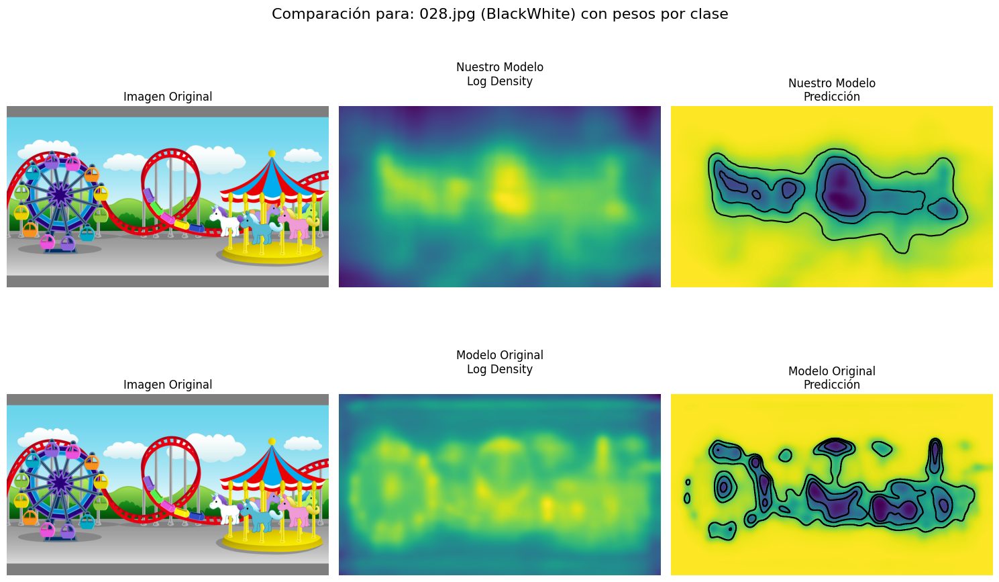


Procesando: 158.jpg
Categoría: BlackWhite (idx: 3)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


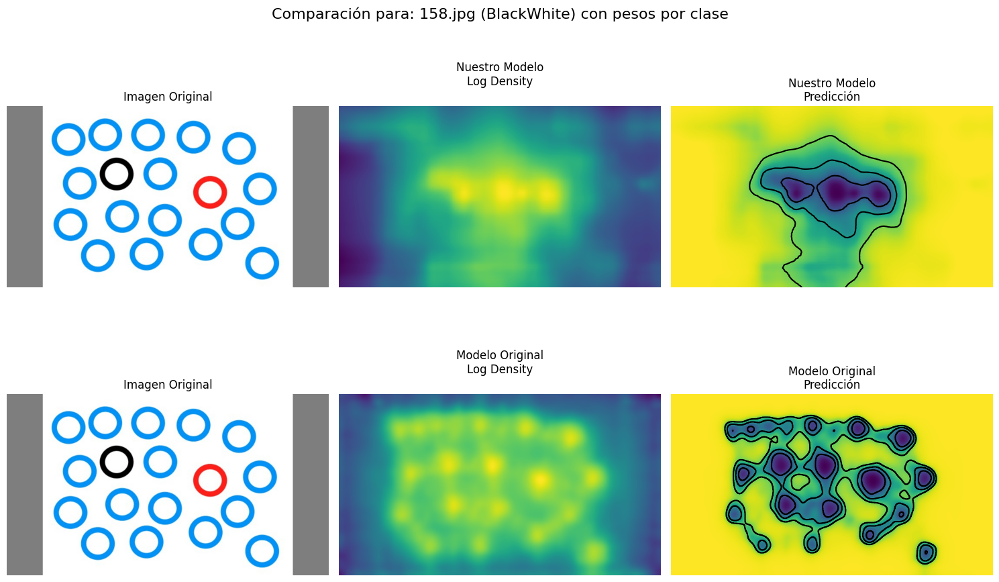


Procesando: 180.jpg
Categoría: BlackWhite (idx: 3)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


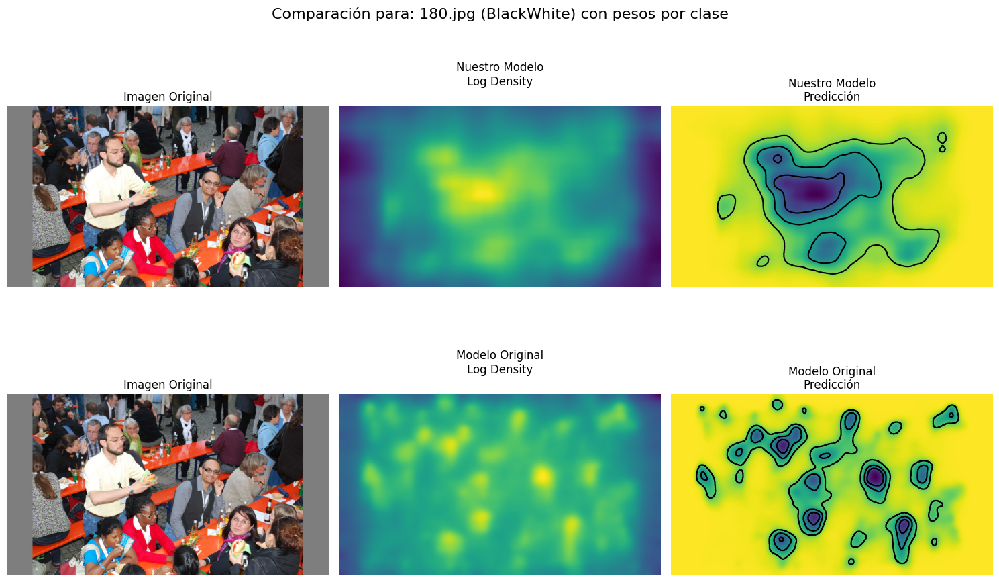


Procesando: 190.jpg
Categoría: Social (idx: 19)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


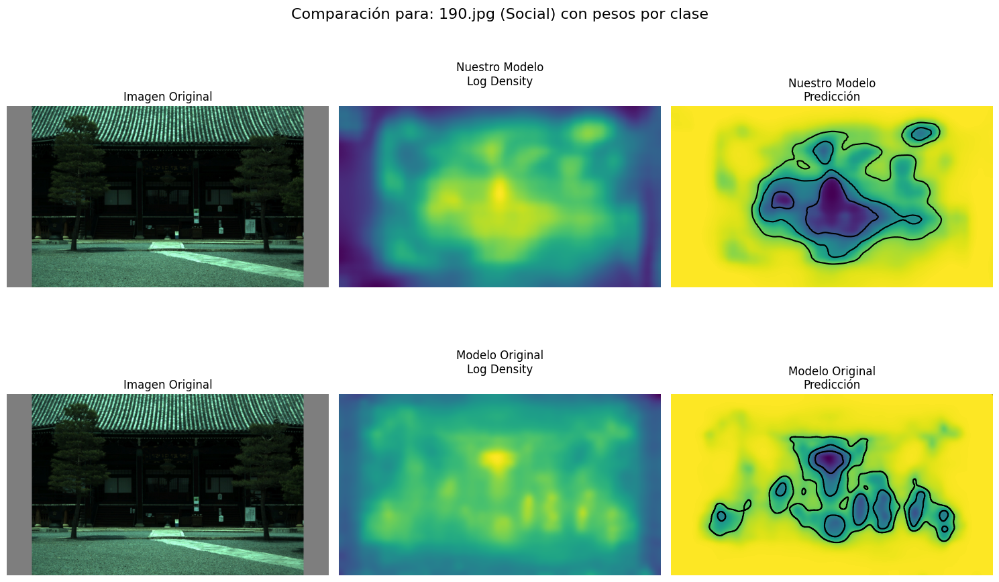


Procesando: 9107ae4604381c7cada00ea3ba2b33e3.jpg
Categoría: Cartoon (idx: 4)
Forma de our_pred: (1080, 1920)
Forma de pretrained_pred: (1080, 1920)


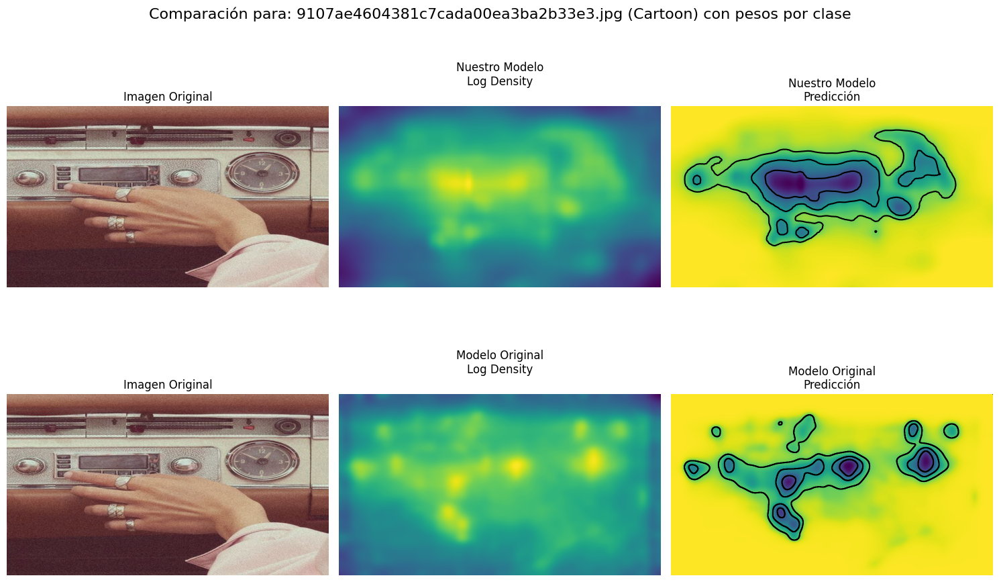

In [50]:
compare_models(MODEL_PATH, INPUT_FOLDER, MIT_CENTERBIAS_PATH)